# "EdiFungi: Prepare Machine Learning Model to Safeguard Foragers by Distinguishing Poisonous from Edible Mushrooms"


## Problem Statement

The overarching objective of this project is to develop a robust and accurate machine learning model capable of predicting the edibility status of mushrooms, discerning between poisonous and edible varieties, leveraging a comprehensive set of features that encapsulate various attributes such as cap shape, cap surface, gill characteristics, stem dimensions, veil properties, and spore print color. Through extensive analysis and predictive modeling, the goal is to create a reliable tool for differentiating between mushroom types, ensuring the safety of individuals engaging in mushroom foraging or related activities.


1) Class: Target variable indicating whether the mushroom is poisonous ('p') or edible ('e’).
2) Cap-diameter: Diameter of the mushroom cap.
3) Cap-shape: Shape of the mushroom cap.
4) Cap-surface: The surface texture of the mushroom cap.
5) Cap color: The color of the mushroom cap.
6) Does-bruise-or-bleed: Whether the mushroom bruises or bleeds.
7) Gill-attachment: Attachment type of the gills.
8) Gill-spacing: Spacing between gills.
9) Gill-color: Color of the gills.
10) Stem-height: Height of the mushroom stem.
11) Stem-width: Width of the mushroom stem.
12) Stem-root: Root type of the mushroom stem.
13) Stem-surface: Surface texture of the mushroom stem.
14) Stem-color: Color of the mushroom stem.
15) Veil-type: Type of veil covering the gills (seems to have only one value, which may not provide useful information).
16) Veil-color: Color of the veil.
17) has-ring: Whether the mushroom has a ring.
18) ring-type: Type of ring on the mushroom.
19) Spore-print-color: Color of the spore print.
20) Habitat: Habitat where the mushroom is found.
21) Season: Season in which the mushroom is found.

In [1]:
import pandas as pd
import numpy as np 
import warnings
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import probplot
import statsmodels.api as sm
from scipy.stats import shapiro
from scipy.stats import ttest_ind, mannwhitneyu
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from scipy.stats import skew   
from plotly.subplots import make_subplots

from sklearn.model_selection import train_test_split
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import recall_score,precision_score,classification_report,roc_auc_score,roc_curve

import warnings
import plotly.express as px
warnings.filterwarnings("ignore")

In [2]:
df = pd.read_csv("Data.csv")

In [3]:
df.head()

,class,cap-diameter,cap-shape,cap-surface,cap-color,does-bruise-or-bleed,gill-attachment,gill-spacing,gill-color,stem-height,...,stem-root,stem-surface,stem-color,veil-type,veil-color,has-ring,ring-type,spore-print-color,habitat,season
0,p,15.26,x,g,o,f,e,NaN,w,16.95,...,s,y,w,u,w,t,g,NaN,d,w
1,p,16.60,x,g,o,f,e,NaN,w,17.99,...,s,y,w,u,w,t,g,NaN,d,u
2,p,14.07,x,g,o,f,e,NaN,w,17.80,...,s,y,w,u,w,t,g,NaN,d,w
3,p,14.17,f,h,e,f,e,NaN,w,15.77,...,s,y,w,u,w,t,p,NaN,d,w
4,p,14.64,x,h,o,f,e,NaN,w,16.53,...,s,y,w,u,w,t,p,NaN,d,w


In [4]:
df.isnull().sum()

class                       0
cap-diameter                0
cap-shape                   0
cap-surface             14120
cap-color                   0
does-bruise-or-bleed        0
gill-attachment          9884
gill-spacing            25063
gill-color                  0
stem-height                 0
stem-width                  0
stem-root               51538
stem-surface            38124
stem-color                  0
veil-type               57892
veil-color              53656
has-ring                    0
ring-type                2471
spore-print-color       54715
habitat                     0
season                      0
dtype: int64

In [5]:
df.shape

(61069, 21)

In [6]:
df["class"].value_counts()

class
p    33888
e    27181
Name: count, dtype: int64

In [7]:
df1 = pd.read_csv("Data 2.csv")

In [8]:
df1.head()

,family,name,class,cap-diameter,cap-shape,Cap-surface,cap-color,does-bruise-or-bleed,gill-attachment,gill-spacing,...,stem-root,stem-surface,stem-color,veil-type,veil-color,has-ring,ring-type,Spore-print-color,habitat,season
0,Amanita Family,Fly Agaric,p,[10,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Amanita Family,Panther Cap,p,[5,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Amanita Family,False Panther Cap,p,[10,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Amanita Family,The Blusher,e,[5,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Amanita Family,Death Cap,p,[5,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
df1.columns

Index(['family', 'name', 'class', 'cap-diameter', 'cap-shape', 'Cap-surface',
       'cap-color', 'does-bruise-or-bleed', 'gill-attachment', 'gill-spacing',
       'gill-color', 'stem-height', 'stem-width', 'stem-root', 'stem-surface',
       'stem-color', 'veil-type', 'veil-color', 'has-ring', 'ring-type',
       'Spore-print-color', 'habitat', 'season'],
      dtype='object')

In [10]:
df1.drop(columns = ['cap-diameter', 'cap-shape', 'Cap-surface',
       'cap-color', 'does-bruise-or-bleed', 'gill-attachment', 'gill-spacing',
       'gill-color', 'stem-height', 'stem-width', 'stem-root', 'stem-surface',
       'stem-color', 'veil-type', 'veil-color', 'has-ring', 'ring-type',
       'Spore-print-color', 'habitat', 'season'], inplace = True)

In [11]:
df1.head()

,family,name,class
0,Amanita Family,Fly Agaric,p
1,Amanita Family,Panther Cap,p
2,Amanita Family,False Panther Cap,p
3,Amanita Family,The Blusher,e
4,Amanita Family,Death Cap,p


In [12]:
df1.shape

(173, 3)

In [13]:
df1["class"].value_counts()

class
p    96
e    77
Name: count, dtype: int64

In [14]:
df1["family"].value_counts()

family
Tricholoma Family         43
Russula Family            27
Bolete Family             14
Ink Cap Family            13
Cortinarius Family        11
Stropharia Family          8
Amanita Family             8
Wax Gill Family            8
Entoloma Family            7
Bracket Fungi              7
Mushroom Family            5
Bolbitius Family           3
Lepiota Family             3
Paxillus Family            3
Chanterelle Family         3
Pluteus Family             2
Oyster Mushroom Family     2
Crepidotus Family          1
Hydnum Family              1
Ear-Pick Family            1
Saddle-Cup Family          1
Morel Family               1
Jelly Discs Family         1
Name: count, dtype: int64

In [15]:
df1.head(170)

,family,name,class
0,Amanita Family,Fly Agaric,p
1,Amanita Family,Panther Cap,p
2,Amanita Family,False Panther Cap,p
3,Amanita Family,The Blusher,e
4,Amanita Family,Death Cap,p
...,...,...,...
165,Bracket Fungi,Dryad's Saddle,e
166,Bracket Fungi,Fuzzy Polypore,p
167,Bracket Fungi,Brown Goblet,p
168,Saddle-Cup Family,White Saddle,p


In [16]:
pos = df1[df1["class"] == "p"]

In [17]:
neg = df1[df1["class"] == "e"]

In [18]:
pos["family"].value_counts()

family
Tricholoma Family     20
Russula Family        16
Cortinarius Family    11
Stropharia Family      7
Ink Cap Family         7
Entoloma Family        6
Bracket Fungi          6
Amanita Family         5
Wax Gill Family        4
Bolete Family          3
Paxillus Family        3
Bolbitius Family       2
Ear-Pick Family        1
Saddle-Cup Family      1
Mushroom Family        1
Crepidotus Family      1
Lepiota Family         1
Jelly Discs Family     1
Name: count, dtype: int64

In [19]:
pos["name"].value_counts()

name
Fly Agaric                  1
Panther Cap                 1
Moss Pixy Cap               1
Spectacular Gymnopile       1
Rusty Wood Rotter           1
                           ..
Geranium-scented Russula    1
Parrot Wax Cap              1
Blackening Wax Cap          1
Orange-red Wax Cap          1
Jelly Babies                1
Name: count, Length: 96, dtype: int64

In [20]:
neg

,family,name,class
3,Amanita Family,The Blusher,e
5,Amanita Family,False Death Cap,e
7,Amanita Family,Tawny Grisette,e
8,Lepiota Family,Parasol Mushroom,e
9,Lepiota Family,Shaggy Parasol,e
...,...,...,...
157,Oyster Mushroom Family,Oyster Mushroom,e
158,Oyster Mushroom Family,Branched Oyster Mushroom,e
161,Hydnum Family,Hedgehog Fungus,e
165,Bracket Fungi,Dryad's Saddle,e


In [21]:
len(df1["name"].unique())

173

In [22]:
(df.isnull().sum()/61069)*100

class                    0.000000
cap-diameter             0.000000
cap-shape                0.000000
cap-surface             23.121387
cap-color                0.000000
does-bruise-or-bleed     0.000000
gill-attachment         16.184971
gill-spacing            41.040462
gill-color               0.000000
stem-height              0.000000
stem-width               0.000000
stem-root               84.393064
stem-surface            62.427746
stem-color               0.000000
veil-type               94.797688
veil-color              87.861272
has-ring                 0.000000
ring-type                4.046243
spore-print-color       89.595376
habitat                  0.000000
season                   0.000000
dtype: float64

In [23]:
df.describe()

,cap-diameter,stem-height,stem-width
count,61069.000000,61069.000000,61069.000000
mean,6.733854,6.581538,12.149410
std,5.264845,3.370017,10.035955
min,0.380000,0.000000,0.000000
25%,3.480000,4.640000,5.210000
50%,5.860000,5.950000,10.190000
75%,8.540000,7.740000,16.570000
max,62.340000,33.920000,103.910000


### Handling Missing Values

In [24]:
df = df.drop(columns = ["spore-print-color", "veil-color", "veil-type", "stem-surface", "stem-root", "gill-spacing"])

1) The columns 'veil-type' and 'veil-color' have percentages of missing values around 94.80% and 87.86%, respectively. These percentages are very high, so dropping these columns.


2) Similarly, the 'stem-root' column has a missing value percentage of 84.39%, which is also quite high. dropping it as well.

In [25]:
df.isnull().sum()

class                       0
cap-diameter                0
cap-shape                   0
cap-surface             14120
cap-color                   0
does-bruise-or-bleed        0
gill-attachment          9884
gill-color                  0
stem-height                 0
stem-width                  0
stem-color                  0
has-ring                    0
ring-type                2471
habitat                     0
season                      0
dtype: int64

In [26]:
l = ["ring-type", "gill-attachment", "cap-surface"]

for col in l:
    
    print(df[col].value_counts())
    
    
    print("****************************")


ring-type
f    48361
e     2435
z     2118
l     1427
r     1399
p     1265
g     1240
m      353
Name: count, dtype: int64
****************************
gill-attachment
a    12698
d    10247
x     7413
p     6001
e     5648
s     5648
f     3530
Name: count, dtype: int64
****************************
cap-surface
t    8196
s    7608
y    6341
h    4974
g    4724
d    4432
e    2584
k    2303
i    2225
w    2150
l    1412
Name: count, dtype: int64
****************************


In [27]:
l = ["ring-type", "gill-attachment", "cap-surface"]

for col in l:
    mode_value = df[col].mode()[0]
    df[col] = np.where(df[col].isna(), mode_value, df[col])

#### ring-type:

Since "ring-type" is a categorical column with distinct categories (f, e, z, l, r, p, g, m), and it seems to be a nominal variable (no inherent order between categories), we can use the mode (most frequent category) for imputation.

#### gill-attachment:

Similar to "ring-type," "gill-attachment" is a categorical column with distinct categories (a, d, x, p, e, s, f). we can also use the mode for imputation.

#### cap-surface:

For "cap-surface," which is also a categorical column with distinct categories (t, s, y, h, g, d, e, k, i, w, l), we can use the mode as well.

In [28]:
df.shape

(61069, 15)

In [29]:
df.isnull().sum()

class                   0
cap-diameter            0
cap-shape               0
cap-surface             0
cap-color               0
does-bruise-or-bleed    0
gill-attachment         0
gill-color              0
stem-height             0
stem-width              0
stem-color              0
has-ring                0
ring-type               0
habitat                 0
season                  0
dtype: int64

## Hypothesis Testing

In [30]:
df.head()

,class,cap-diameter,cap-shape,cap-surface,cap-color,does-bruise-or-bleed,gill-attachment,gill-color,stem-height,stem-width,stem-color,has-ring,ring-type,habitat,season
0,p,15.26,x,g,o,f,e,w,16.95,17.09,w,t,g,d,w
1,p,16.60,x,g,o,f,e,w,17.99,18.19,w,t,g,d,u
2,p,14.07,x,g,o,f,e,w,17.80,17.74,w,t,g,d,w
3,p,14.17,f,h,e,f,e,w,15.77,15.98,w,t,p,d,w
4,p,14.64,x,h,o,f,e,w,16.53,17.20,w,t,p,d,w


#### Distribution plots for numerical Variable

In [31]:
# Separate data based on target classes

class_p = df[df['class'] == 'p']
class_e = df[df['class'] == 'e']

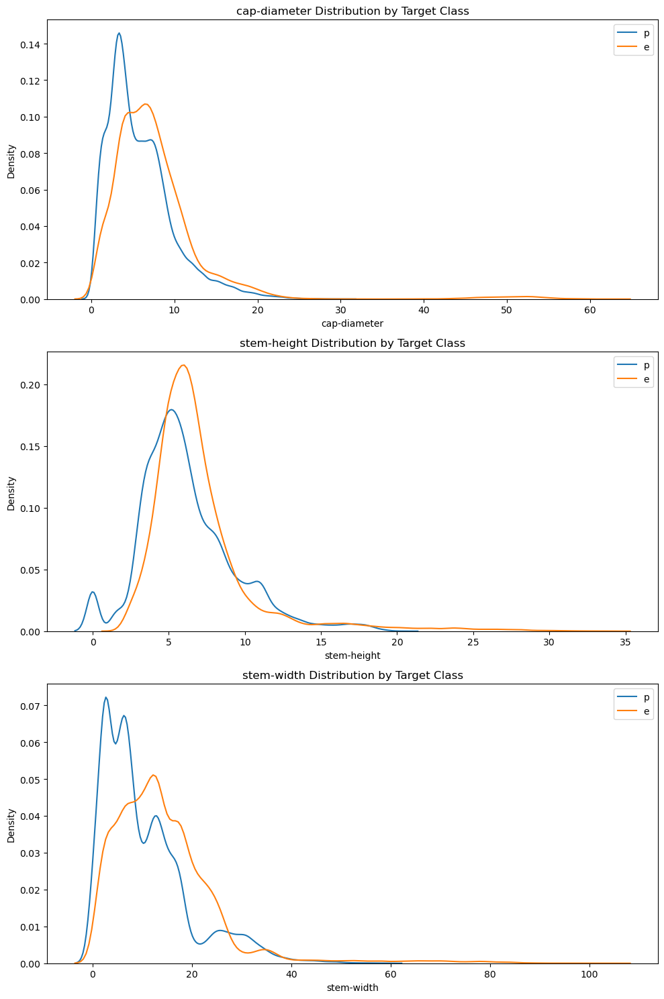

In [32]:
# KDE plots

num_cat = ['cap-diameter', 'stem-height', 'stem-width']

fig, axes = plt.subplots(3, 1, figsize=(10, 15))

for i, column in enumerate(num_cat):
    sns.kdeplot(class_p[column], label='p', ax=axes[i])
    sns.kdeplot(class_e[column], label='e', ax=axes[i])
    axes[i].set_title(f'{column} Distribution by Target Class')
    axes[i].legend()

plt.tight_layout()
plt.show()

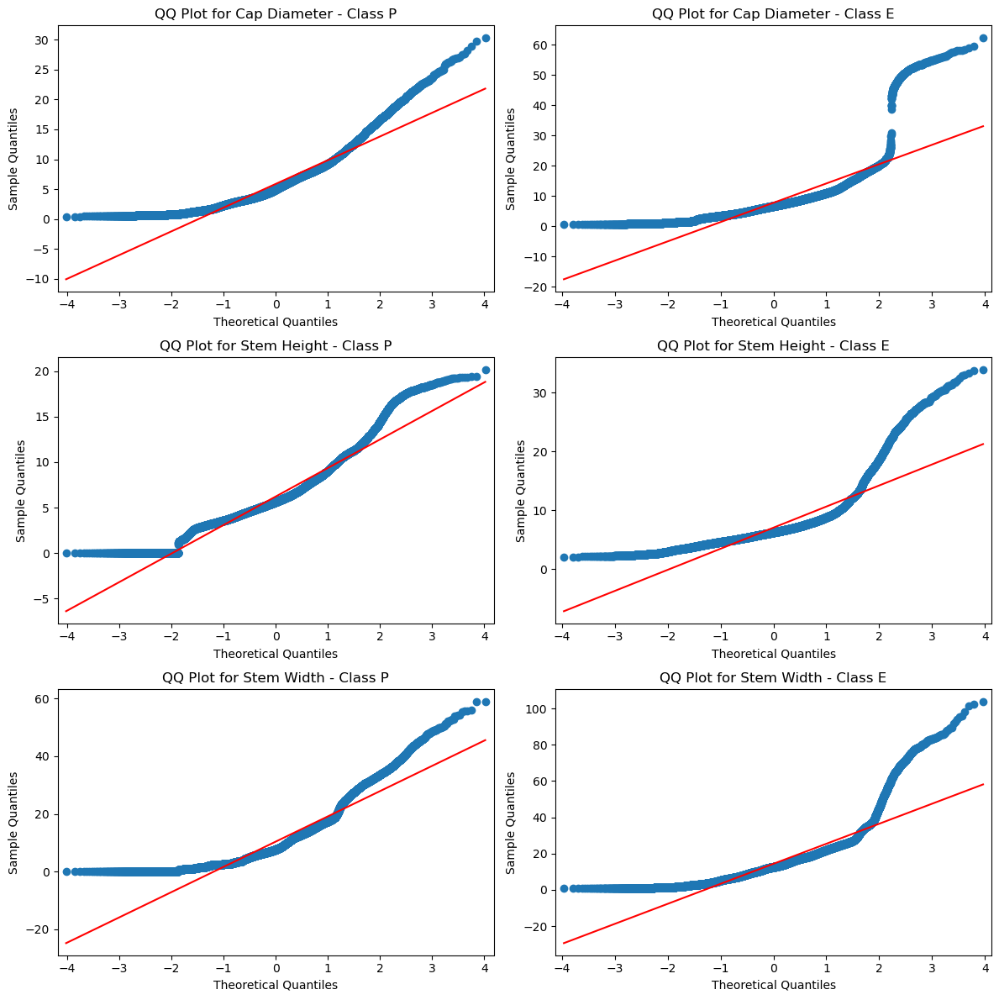

In [33]:
# Create subplots
fig, axes = plt.subplots(3, 2, figsize=(12, 12))

# Plot the QQ plot for class_p - cap-diameter
sm.qqplot(class_p['cap-diameter'], line='s', ax=axes[0, 0])
axes[0, 0].set_title("QQ Plot for Cap Diameter - Class P")
axes[0, 0].set_xlabel("Theoretical Quantiles")
axes[0, 0].set_ylabel("Sample Quantiles")

# Plot the QQ plot for class_e - cap-diameter
sm.qqplot(class_e['cap-diameter'], line='s', ax=axes[0, 1])
axes[0, 1].set_title("QQ Plot for Cap Diameter - Class E")
axes[0, 1].set_xlabel("Theoretical Quantiles")
axes[0, 1].set_ylabel("Sample Quantiles")

# Plot the QQ plot for class_p - stem-height
sm.qqplot(class_p['stem-height'], line='s', ax=axes[1, 0])
axes[1, 0].set_title("QQ Plot for Stem Height - Class P")
axes[1, 0].set_xlabel("Theoretical Quantiles")
axes[1, 0].set_ylabel("Sample Quantiles")

# Plot the QQ plot for class_e - stem-height
sm.qqplot(class_e['stem-height'], line='s', ax=axes[1, 1])
axes[1, 1].set_title("QQ Plot for Stem Height - Class E")
axes[1, 1].set_xlabel("Theoretical Quantiles")
axes[1, 1].set_ylabel("Sample Quantiles")

# Plot the QQ plot for class_p - stem-width
sm.qqplot(class_p['stem-width'], line='s', ax=axes[2, 0])
axes[2, 0].set_title("QQ Plot for Stem Width - Class P")
axes[2, 0].set_xlabel("Theoretical Quantiles")
axes[2, 0].set_ylabel("Sample Quantiles")

# Plot the QQ plot for class_e - stem-width
sm.qqplot(class_e['stem-width'], line='s', ax=axes[2, 1])
axes[2, 1].set_title("QQ Plot for Stem Width - Class E")
axes[2, 1].set_xlabel("Theoretical Quantiles")
axes[2, 1].set_ylabel("Sample Quantiles")

# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()

### Shapiro-Wilk test

In [34]:
num_cat = ['cap-diameter', 'stem-height', 'stem-width']

for i in (num_cat):
    variable = i  

    # sample data for the variable and handle missing values
    sample_data = df[variable]

    # Shapiro-Wilk test
    statistic, p_value = shapiro(sample_data)

    # results
    print(f'Shapiro-Wilk test statistic: {statistic}')
    print(f'p-value: {p_value}')

    # Check the significance level
    alpha = 0.05
    if p_value > alpha:
        print(f"The data for '{variable}' appears to be normally distributed (fail to reject the null hypothesis)")
    else:
        print(f"The data for '{variable}' does not appear to be normally distributed (reject the null hypothesis)")
        
    print("--------------------------------------------------------------------------------------------------------")

Shapiro-Wilk test statistic: 0.7347204685211182
p-value: 0.0
The data for 'cap-diameter' does not appear to be normally distributed (reject the null hypothesis)
--------------------------------------------------------------------------------------------------------
Shapiro-Wilk test statistic: 0.8542211055755615
p-value: 0.0
The data for 'stem-height' does not appear to be normally distributed (reject the null hypothesis)
--------------------------------------------------------------------------------------------------------
Shapiro-Wilk test statistic: 0.8401085138320923
p-value: 0.0
The data for 'stem-width' does not appear to be normally distributed (reject the null hypothesis)
--------------------------------------------------------------------------------------------------------


### Mann-Whitney U test

In [35]:
num_cat = ['cap-diameter', 'stem-height', 'stem-width']

for i in (num_cat):
    variable = i  

    
    u_stat, mw_p_value = mannwhitneyu(class_p[variable], class_e[variable])
    print(f"Mann-Whitney U test p-value: {mw_p_value}")
    
    alpha = 0.05

    if mw_p_value > alpha:
        print(f"The data for '{variable}' are no significant differences (fail to reject the null hypothesis)")
    else:
        print(f"The data for '{variable}' sample distributions are not equal (reject the null hypothesis)")
          
    print("-----------------------------------------------------------------------------------------------------")

Mann-Whitney U test p-value: 0.0
The data for 'cap-diameter' sample distributions are not equal (reject the null hypothesis)
-----------------------------------------------------------------------------------------------------
Mann-Whitney U test p-value: 3.8723204042799624e-235
The data for 'stem-height' sample distributions are not equal (reject the null hypothesis)
-----------------------------------------------------------------------------------------------------
Mann-Whitney U test p-value: 0.0
The data for 'stem-width' sample distributions are not equal (reject the null hypothesis)
-----------------------------------------------------------------------------------------------------


## Exploratory_Data_Analysis

### Univarient Analysis

In [36]:
import plotly.express as px

# Assuming 'cap-diameter' is a column in your DataFrame df
variable = 'cap-diameter'

# Create an interactive box plot with Plotly Express
fig_box = px.box(df, y=variable, title=f'Box Plot for {variable}')
fig_box.update_layout(title_text=f'Box Plot for {variable}')  
fig_box.show()

# Create an interactive violin plot with Plotly Express
fig_violin = px.violin(df, y=variable, box=True, title=f'Violin Plot for {variable}')
fig_violin.update_layout(title_text=f'Violin Plot for {variable}')
fig_violin.show()

In [37]:
# Assuming 'cap-diameter' is a column in your DataFrame df
variable = 'stem-height'

# Create an interactive box plot with Plotly Express
fig_box = px.box(df, y=variable, title=f'Box Plot for {variable}')
fig_box.update_layout(title_text=f'Box Plot for {variable}')  
fig_box.show()

# Create an interactive violin plot with Plotly Express
fig_violin = px.violin(df, y=variable, box=True, title=f'Violin Plot for {variable}')
fig_violin.update_layout(title_text=f'Violin Plot for {variable}')
fig_violin.show()

In [38]:
# Assuming 'cap-diameter' is a column in your DataFrame df
variable = 'stem-width'

# Create an interactive box plot with Plotly Express
fig_box = px.box(df, y=variable, title=f'Box Plot for {variable}')
fig_box.update_layout(title_text=f'Box Plot for {variable}')  
fig_box.show()

# Create an interactive violin plot with Plotly Express
fig_violin = px.violin(df, y=variable, box=True, title=f'Violin Plot for {variable}')
fig_violin.update_layout(title_text=f'Violin Plot for {variable}')
fig_violin.show()

### Multivarient Analysis

In [39]:
df.columns

Index(['class', 'cap-diameter', 'cap-shape', 'cap-surface', 'cap-color',
       'does-bruise-or-bleed', 'gill-attachment', 'gill-color', 'stem-height',
       'stem-width', 'stem-color', 'has-ring', 'ring-type', 'habitat',
       'season'],
      dtype='object')

In [40]:
cat_col = ['cap-shape', 'cap-surface', 'cap-color',
       'does-bruise-or-bleed', 'gill-attachment', 'gill-color',
        'stem-color', 'has-ring', 'ring-type', 'habitat',
       'season']

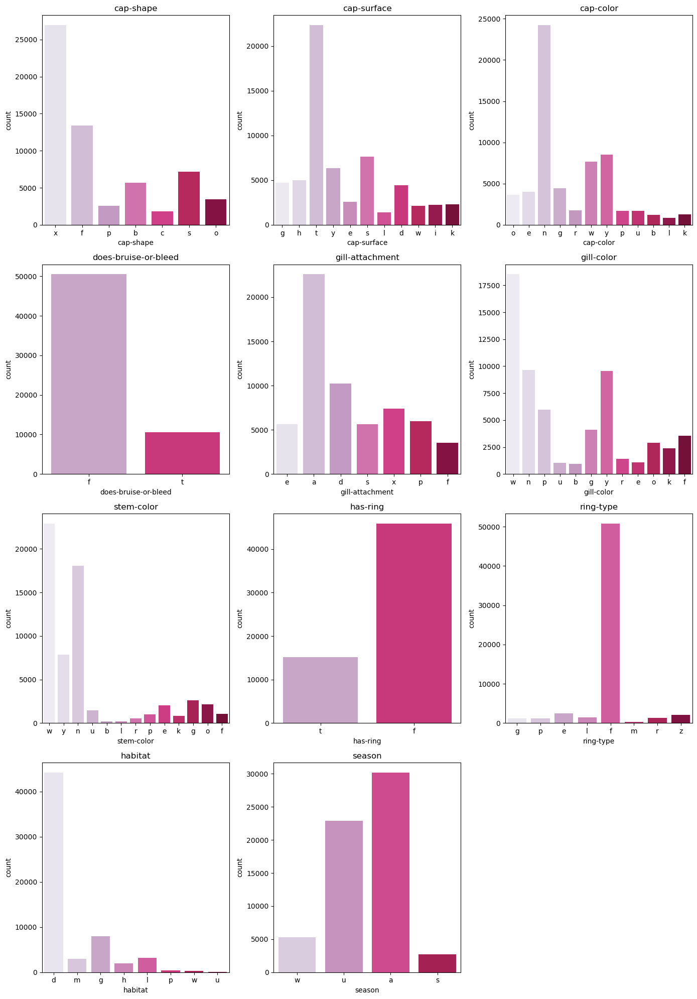

In [41]:
plt.figure(figsize=(14, 20))
num_cols = 3  # Increase the number of columns based on your preference
num_rows = 4  # Calculate the number of rows needed

for i, column in enumerate(cat_col):
    plt.subplot(num_rows, num_cols, i+1)
    sns.countplot(x=column, data=df, palette="PuRd")
    plt.title(column)

plt.tight_layout()
plt.show()

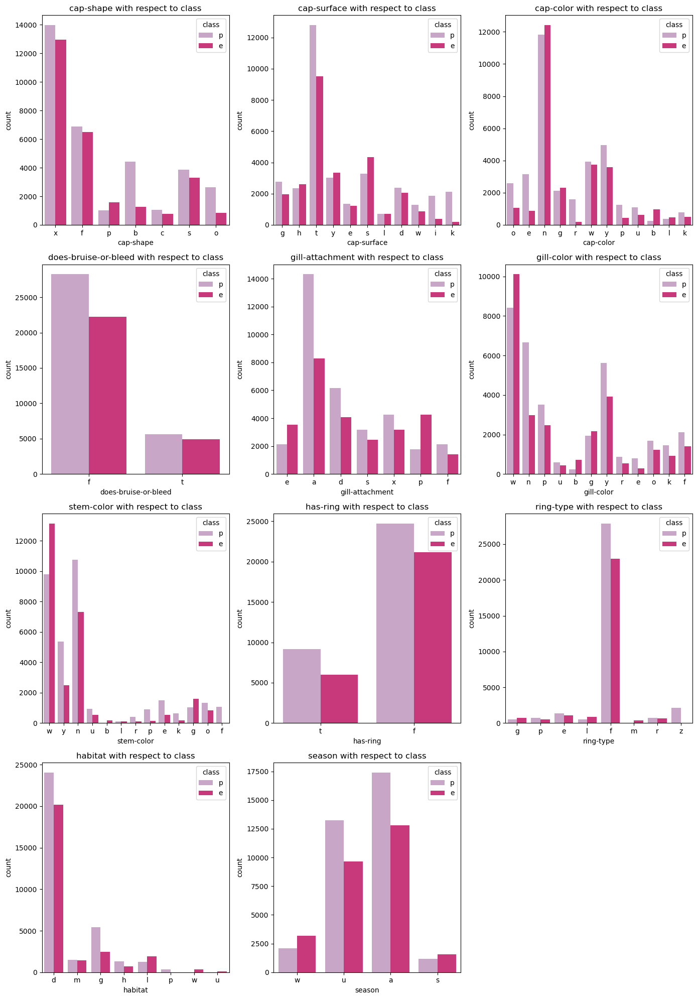

In [42]:
target_category = "class"
plt.figure(figsize=(14, 20))

for i, column in enumerate(cat_col):
    plt.subplot(4, 3, i+1)
    sns.countplot(x=column, hue=target_category, data=df, palette="PuRd")
    plt.title(f'{column} with respect to {target_category}')

plt.tight_layout()
plt.show()

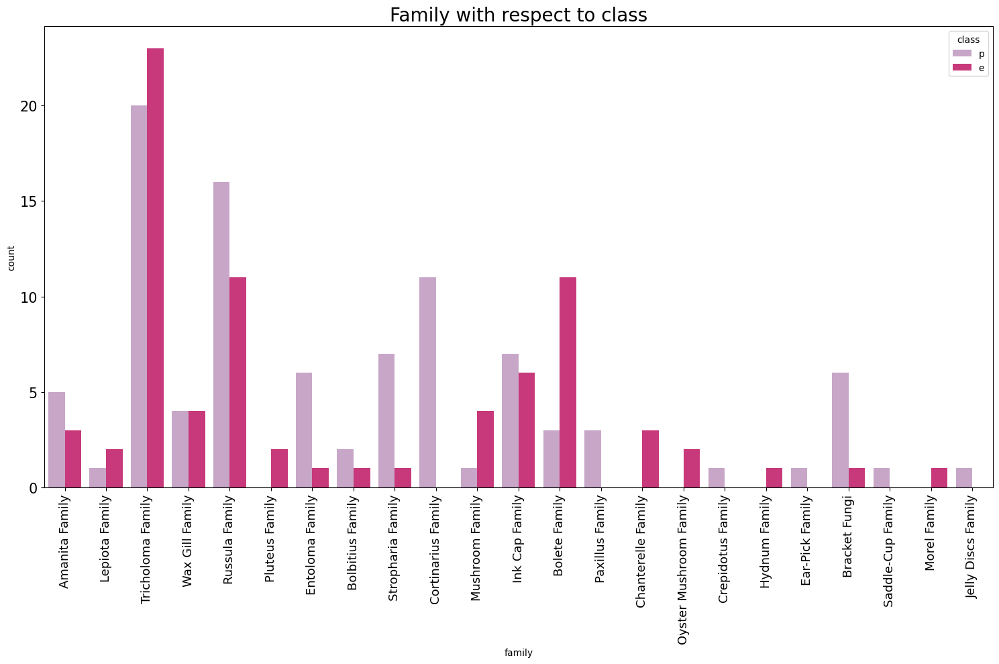

In [43]:
target_category = "class"
plt.figure(figsize=(15, 10))

# Assuming 'family' is a column in your DataFrame df1
sns.countplot(x="family", hue=target_category, data=df1, palette="PuRd")

# Increase the label size and rotate the x-axis labels
plt.xticks(rotation=90, fontsize=13)
plt.yticks(fontsize=15)

plt.title(f'Family with respect to {target_category}', fontsize=20)
plt.tight_layout()
plt.show()

### Target Variable 

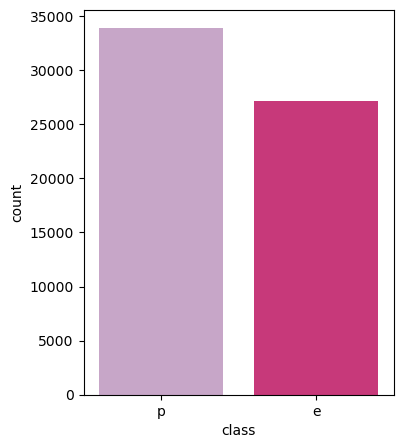

In [44]:
plt.figure(figsize=(4,5))
sns.countplot(data=df, x= "class", palette="PuRd")
plt.show()

### Encoding

In [45]:
X = df.drop("class", axis = 1)

In [46]:
X.head()

,cap-diameter,cap-shape,cap-surface,cap-color,does-bruise-or-bleed,gill-attachment,gill-color,stem-height,stem-width,stem-color,has-ring,ring-type,habitat,season
0,15.26,x,g,o,f,e,w,16.95,17.09,w,t,g,d,w
1,16.60,x,g,o,f,e,w,17.99,18.19,w,t,g,d,u
2,14.07,x,g,o,f,e,w,17.80,17.74,w,t,g,d,w
3,14.17,f,h,e,f,e,w,15.77,15.98,w,t,p,d,w
4,14.64,x,h,o,f,e,w,16.53,17.20,w,t,p,d,w


In [47]:
y = df["class"]

In [48]:
y = df.iloc[:, 0:1]

In [49]:
y.head()

,class
0,p
1,p
2,p
3,p
4,p


In [50]:
X.columns

Index(['cap-diameter', 'cap-shape', 'cap-surface', 'cap-color',
       'does-bruise-or-bleed', 'gill-attachment', 'gill-color', 'stem-height',
       'stem-width', 'stem-color', 'has-ring', 'ring-type', 'habitat',
       'season'],
      dtype='object')

In [51]:
columns_to_encode = ['cap-shape', 'cap-surface', 'cap-color',
       'does-bruise-or-bleed', 'gill-attachment', 'gill-color',
       'stem-color', 'has-ring', 'ring-type', 'habitat',
       'season']

In [53]:
le = LabelEncoder()

In [54]:
for column in columns_to_encode:
    X[column] = le.fit_transform(X[column])

In [55]:
# Use get_dummies to perform one-hot encoding
#X = pd.get_dummies(X, columns=columns_to_encode, drop_first=True)

In [56]:
#X = X.astype(int)

In [57]:
X.head()

,cap-diameter,cap-shape,cap-surface,cap-color,does-bruise-or-bleed,gill-attachment,gill-color,stem-height,stem-width,stem-color,has-ring,ring-type,habitat,season
0,15.26,6,2,6,0,2,10,16.95,17.09,11,1,2,0,3
1,16.60,6,2,6,0,2,10,17.99,18.19,11,1,2,0,2
2,14.07,6,2,6,0,2,10,17.80,17.74,11,1,2,0,3
3,14.17,2,3,1,0,2,10,15.77,15.98,11,1,5,0,3
4,14.64,6,3,6,0,2,10,16.53,17.20,11,1,5,0,3


In [58]:
X.shape

(61069, 14)

In [59]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
X_scaled = scaler.fit_transform(X)

In [62]:
from sklearn.decomposition import PCA

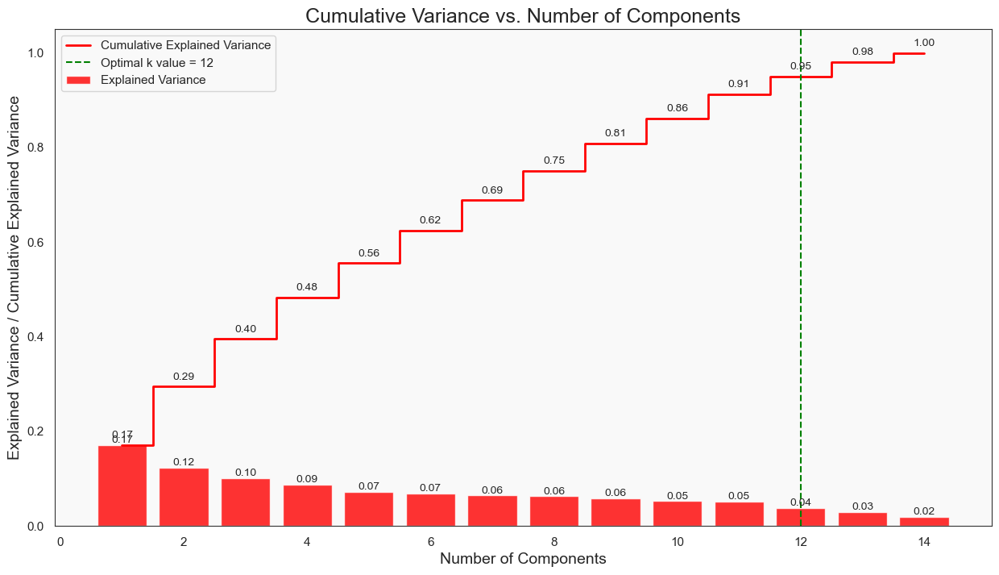

In [63]:
# Apply PCA
pca = PCA().fit(X_scaled)

# Calculate the Cumulative Sum of the Explained Variance
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

# Set the optimal k value
optimal_k = 12

# Set seaborn plot style
sns.set(rc={'axes.facecolor': '#f9f9f9', 'grid.color': '#e1e1e1', 'axes.edgecolor': '#333333', 'axes.linewidth': 0.8})

# Plot the cumulative explained variance against the number of components
plt.figure(figsize=(15, 8))

# Bar chart for the explained variance of each component
plt.bar(x=range(1, len(explained_variance_ratio) + 1), height=explained_variance_ratio, color='red', alpha=0.8, label='Explained Variance')

# Step plot for the cumulative explained variance
plt.step(range(1, len(cumulative_explained_variance) + 1), cumulative_explained_variance, where='mid', color='red', linewidth=2, label='Cumulative Explained Variance')

# Plot optimal k value line
plt.axvline(optimal_k, color='green', linestyle='--', label=f'Optimal k value = {optimal_k}')

# Set labels and title
plt.xlabel('Number of Components', fontsize=14)
plt.ylabel('Explained Variance / Cumulative Explained Variance', fontsize=14)
plt.title('Cumulative Variance vs. Number of Components', fontsize=18)

# Customize legend
plt.legend()

# Display the variance values for the explained variance bar plot
for i, ev_ratio in enumerate(explained_variance_ratio):
    plt.text(i + 1, ev_ratio, f"{ev_ratio:.2f}", ha="center", va="bottom", fontsize=10)

# Display the cumulative variance values for the step plot
for i, cum_ev_ratio in enumerate(cumulative_explained_variance):
    plt.text(i + 1, cum_ev_ratio + 0.01, f"{cum_ev_ratio:.2f}", ha="center", va="bottom", fontsize=10)

plt.grid(axis='both')   
plt.show()


In [64]:
X.shape

(61069, 14)

In [65]:
X.head()

,cap-diameter,cap-shape,cap-surface,cap-color,does-bruise-or-bleed,gill-attachment,gill-color,stem-height,stem-width,stem-color,has-ring,ring-type,habitat,season
0,15.26,6,2,6,0,2,10,16.95,17.09,11,1,2,0,3
1,16.60,6,2,6,0,2,10,17.99,18.19,11,1,2,0,2
2,14.07,6,2,6,0,2,10,17.80,17.74,11,1,2,0,3
3,14.17,2,3,1,0,2,10,15.77,15.98,11,1,5,0,3
4,14.64,6,3,6,0,2,10,16.53,17.20,11,1,5,0,3


In [66]:
le = LabelEncoder()
y = le.fit_transform(y)

In [67]:
y = pd.DataFrame(y, columns = ["class"])

In [68]:
y

,class
0,1
1,1
2,1
3,1
4,1
...,...
61064,1
61065,1
61066,1
61067,1


#### Skewness of Numerical Category

In [69]:
l = ["cap-diameter","stem-height", "stem-width"]

for variable in l:
    skewness = skew(X[variable])
    print(f"The {variable} skewness {skewness}")
    
    print("------------------------------")

The cap-diameter skewness 3.822750077721743
------------------------------
The stem-height skewness 2.0208539960134058
------------------------------
The stem-width skewness 2.164903536205731
------------------------------


## Handling Outliers

In [70]:
### IQR Method

In [71]:
#cap-diameter
Q1 = X["cap-diameter"].quantile(0.25)

Q3 = X["cap-diameter"].quantile(0.75)

IQR = Q3 - Q1 

upper_limit = Q3 + 1.5*(IQR)
lower_limit = Q1 - 1.5*(IQR)

print(f"Q1: {round(Q1, 2)}")
print(f"Q3: {round(Q3, 2)}")
print(f"IQR: {round(IQR, 2)}")
print(f"upper_limit: {round(upper_limit, 2)}")
print(f"lower_limit: {round(lower_limit, 2)}")
print("************************************")

Q1: 3.48
Q3: 8.54
IQR: 5.06
upper_limit: 16.13
lower_limit: -4.11
************************************


In [72]:
### capping Technique is used to traet the outliers
X["cap-diameter"] = np.where(X["cap-diameter"] > upper_limit, upper_limit,
                    np.where(X["cap-diameter"] < lower_limit, lower_limit, 
                    df["cap-diameter"]))

In [73]:
#stem-height
Q1 = X["stem-height"].quantile(0.25)

Q3 = X["stem-height"].quantile(0.75)

IQR = Q3 - Q1 

upper_limit = Q3 + 1.5*(IQR)
lower_limit = Q1 - 1.5*(IQR)

print(f"Q1: {round(Q1, 2)}")
print(f"Q3: {round(Q3, 2)}")
print(f"IQR: {round(IQR, 2)}")
print(f"upper_limit: {round(upper_limit, 2)}")
print(f"lower_limit: {round(lower_limit, 2)}")
print("************************************")


Q1: 4.64
Q3: 7.74
IQR: 3.1
upper_limit: 12.39
lower_limit: -0.01
************************************


In [74]:
### capping Technique is used to traet the outliers
X["stem-height"] = np.where(X["stem-height"] > upper_limit, upper_limit,
                    np.where(X["stem-height"] < lower_limit, lower_limit, 
                    df["stem-height"]))

In [75]:
#stem-width

Q1 = X["stem-width"].quantile(0.25)

Q3 = X["stem-width"].quantile(0.75)

IQR = Q3 - Q1 

upper_limit = Q3 + 1.5*(IQR)
lower_limit = Q1 - 1.5*(IQR)

print(f"Q1: {round(Q1, 2)}")
print(f"Q3: {round(Q3, 2)}")
print(f"IQR: {round(IQR, 2)}")
print(f"upper_limit: {round(upper_limit, 2)}")
print(f"lower_limit: {round(lower_limit, 2)}")
print("************************************")

Q1: 5.21
Q3: 16.57
IQR: 11.36
upper_limit: 33.61
lower_limit: -11.83
************************************


In [76]:
### capping Technique is used to traet the outliers
X["stem-width"] = np.where(X["stem-width"] > upper_limit, upper_limit,
                    np.where(X["stem-width"] < lower_limit, lower_limit, 
                    df["stem-width"]))

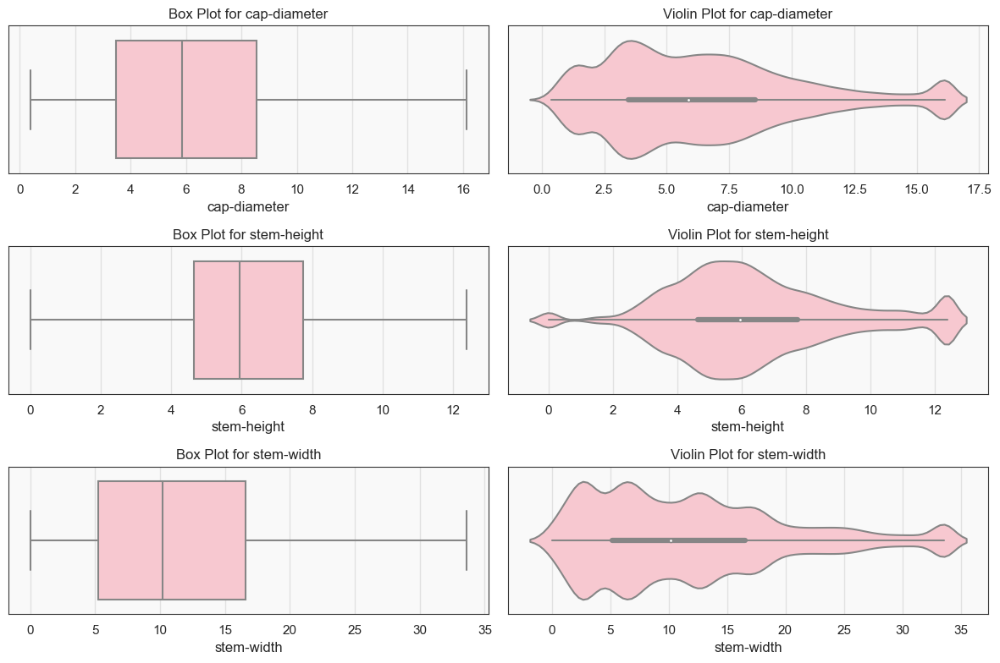

In [77]:
l = ["cap-diameter", "stem-height", "stem-width"]

fig, axes = plt.subplots(len(l), 2, figsize=(12, 8), sharex=False)

for i, variable in enumerate(l):
    sns.boxplot(x=X[variable], color= "pink", ax=axes[i, 0])
    axes[i, 0].set_title(f'Box Plot for {variable}')
    sns.violinplot(x=X[variable], color="pink", ax=axes[i, 1])
    axes[i, 1].set_title(f'Violin Plot for {variable}')

plt.tight_layout()

plt.show()

## Model Building

In [78]:
from sklearn.model_selection import train_test_split

In [79]:
X_train, X_test, y_train, y_test = train_test_split(X,y , random_state= 43, test_size= 0.2 )

In [80]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()

X_train_scaled=scaler.fit_transform(X_train)
X_train=pd.DataFrame(X_train_scaled)

X_test_scaled=scaler.transform(X_test)
X_test=pd.DataFrame(X_test_scaled)

### Logistic Regression

In [81]:
logreg_model = LogisticRegression()
logreg_model.fit(X_train, y_train)
logreg_pred = logreg_model.predict(X_test)
print("Logistic Regression Accuracy:", accuracy_score(y_test, logreg_pred))
print("Logistic Regression Classification Report:")
print(classification_report(y_test, logreg_pred))

Logistic Regression Accuracy: 0.6166693957753397
Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0       0.60      0.46      0.52      5530
           1       0.62      0.75      0.68      6684

    accuracy                           0.62     12214
   macro avg       0.61      0.60      0.60     12214
weighted avg       0.61      0.62      0.61     12214



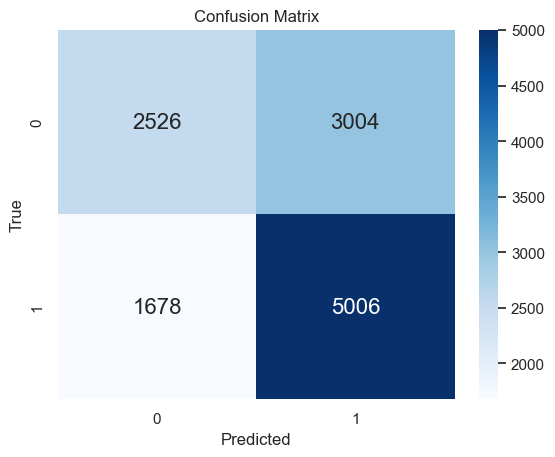

In [82]:
y_pred = logreg_model.predict(X_test)

# Calculate confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix using seaborn
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', annot_kws={"size": 16})
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

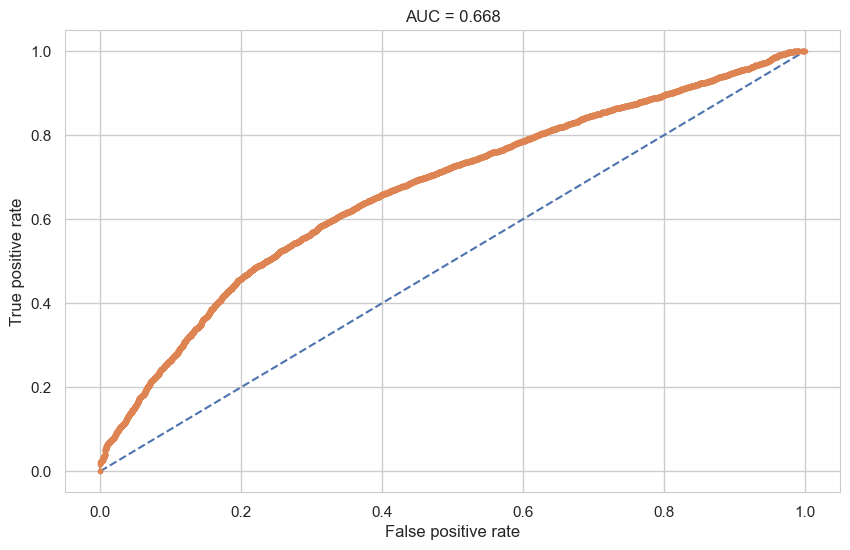

In [83]:
# ROC curve and AUC
probs = logreg_model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
log_auc = roc_auc_score(y_test, probs)

# calculate roc curve
fpr, tpr, thresholds = roc_curve(y_test, probs)
# plot curve
sns.set_style('whitegrid')
plt.figure(figsize=(10,6))
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(fpr, tpr, marker='.')
plt.ylabel('True positive rate')
plt.xlabel('False positive rate')
plt.title(f"AUC = {round(log_auc,3)}")
plt.show()

### Decision Tree Classifier

In [84]:
dt_model = DecisionTreeClassifier(max_depth= 20)
dt_model.fit(X_train, y_train)
dt_pred = dt_model.predict(X_test)
print("\nDecision Tree Accuracy:", accuracy_score(y_test, dt_pred))
print("Decision Tree Classification Report:")
print(classification_report(y_test, dt_pred))


Decision Tree Accuracy: 0.9947601113476339
Decision Tree Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      5530
           1       1.00      0.99      1.00      6684

    accuracy                           0.99     12214
   macro avg       0.99      0.99      0.99     12214
weighted avg       0.99      0.99      0.99     12214



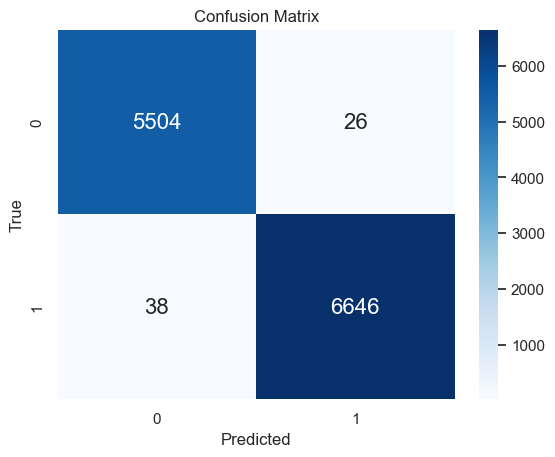

In [85]:
y_pred = dt_model.predict(X_test)

# Calculate confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix using seaborn
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', annot_kws={"size": 16})
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

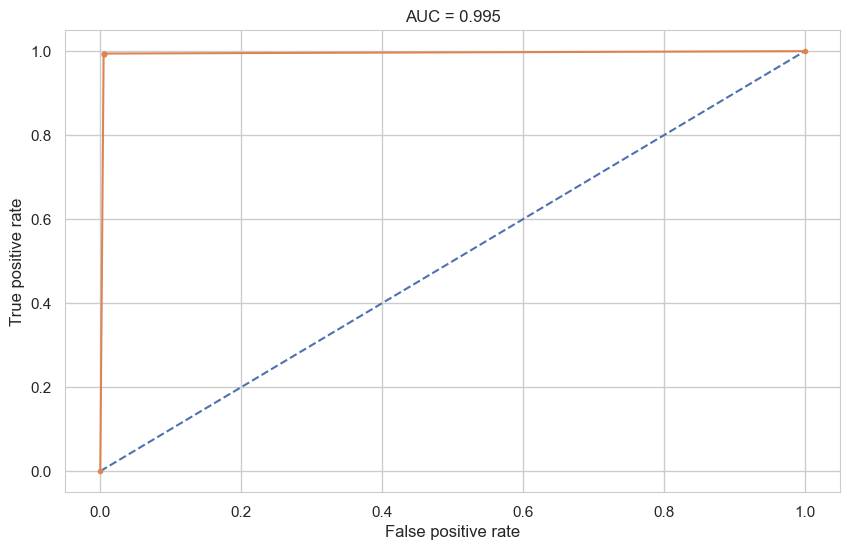

In [86]:
# ROC curve and AUC
probs = dt_model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
log_auc = roc_auc_score(y_test, probs)

# calculate roc curve
fpr, tpr, thresholds = roc_curve(y_test, probs)
# plot curve
sns.set_style('whitegrid')
plt.figure(figsize=(10,6))
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(fpr, tpr, marker='.')
plt.ylabel('True positive rate')
plt.xlabel('False positive rate')
plt.title(f"AUC = {round(log_auc,3)}")
plt.show()

### Random Forest Classifier

In [87]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)
rf_pred = rf_model.predict(X_test)
print("\nRandom Forest Accuracy:", accuracy_score(y_test, rf_pred))
print("Random Forest Classification Report:")
print(classification_report(y_test, rf_pred))


Random Forest Accuracy: 0.9989356476174881
Random Forest Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5530
           1       1.00      1.00      1.00      6684

    accuracy                           1.00     12214
   macro avg       1.00      1.00      1.00     12214
weighted avg       1.00      1.00      1.00     12214



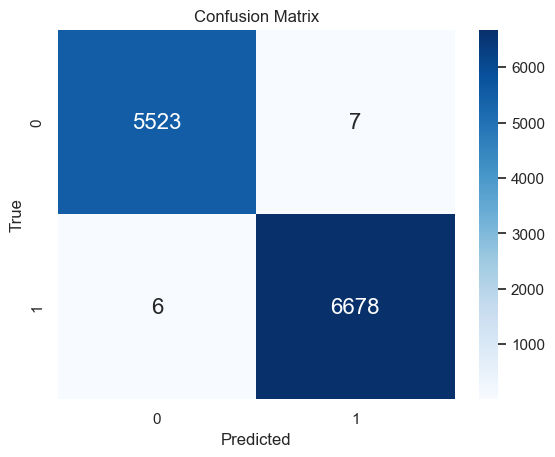

In [88]:
y_pred = rf_model.predict(X_test)

# confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix using seaborn
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', annot_kws={"size": 16})
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

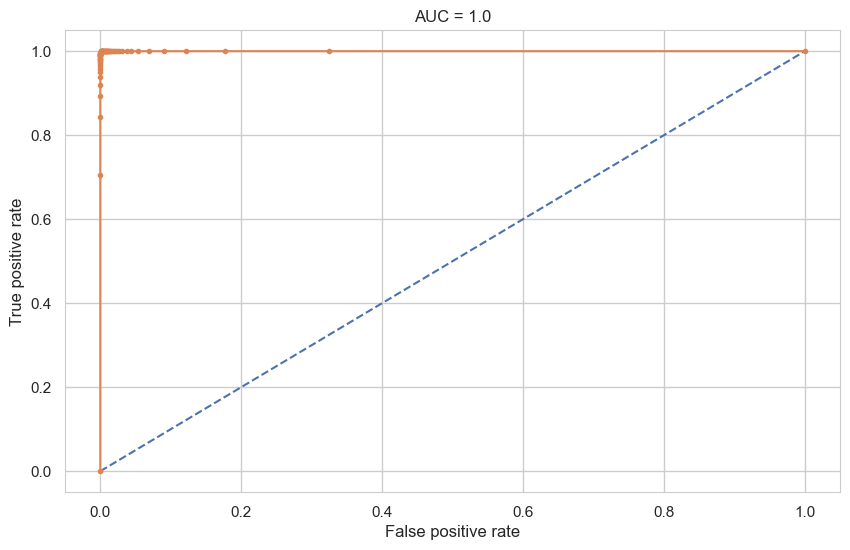

In [89]:
# ROC curve and AUC
probs = rf_model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
log_auc = roc_auc_score(y_test, probs)

# calculate roc curve
fpr, tpr, thresholds = roc_curve(y_test, probs)
# plot curve
sns.set_style('whitegrid')
plt.figure(figsize=(10,6))
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(fpr, tpr, marker='.')
plt.ylabel('True positive rate')
plt.xlabel('False positive rate')
plt.title(f"AUC = {round(log_auc,3)}")
plt.show()

### Support Vector Machines

In [90]:
svm_model = SVC()
svm_model.fit(X_train, y_train)
svm_pred = svm_model.predict(X_test)

print("SVM Accuracy:", accuracy_score(y_test, svm_pred))
print("SVM Classification Report:")
print(classification_report(y_test, svm_pred))

SVM Accuracy: 0.9758473882429999
SVM Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.97      0.97      5530
           1       0.98      0.98      0.98      6684

    accuracy                           0.98     12214
   macro avg       0.98      0.98      0.98     12214
weighted avg       0.98      0.98      0.98     12214



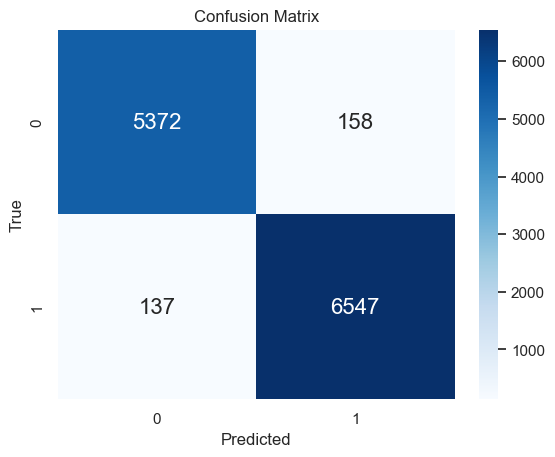

In [91]:
y_pred = svm_model.predict(X_test)

# confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix using seaborn
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', annot_kws={"size": 16})
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

### K-Nearest Neighbors (KNN)¶

In [92]:
knn_model = KNeighborsClassifier()
knn_model.fit(X_train, y_train)
knn_pred = knn_model.predict(X_test)

print("KNN Accuracy:", accuracy_score(y_test, knn_pred))
print("KNN Classification Report:")
print(classification_report(y_test, knn_pred))

KNN Accuracy: 0.9969706893728508
KNN Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5530
           1       1.00      1.00      1.00      6684

    accuracy                           1.00     12214
   macro avg       1.00      1.00      1.00     12214
weighted avg       1.00      1.00      1.00     12214



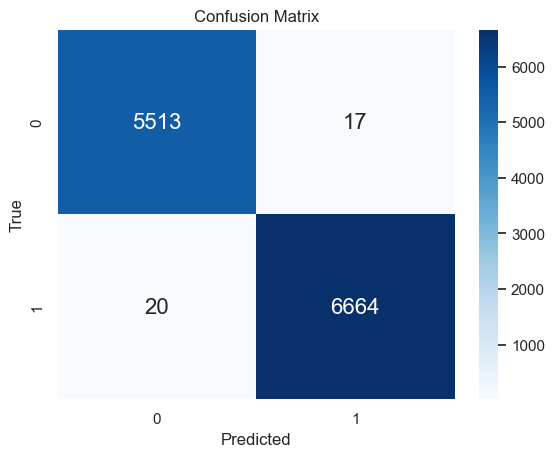

In [93]:
y_pred = knn_model.predict(X_test)

# confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix using seaborn
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', annot_kws={"size": 16})
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

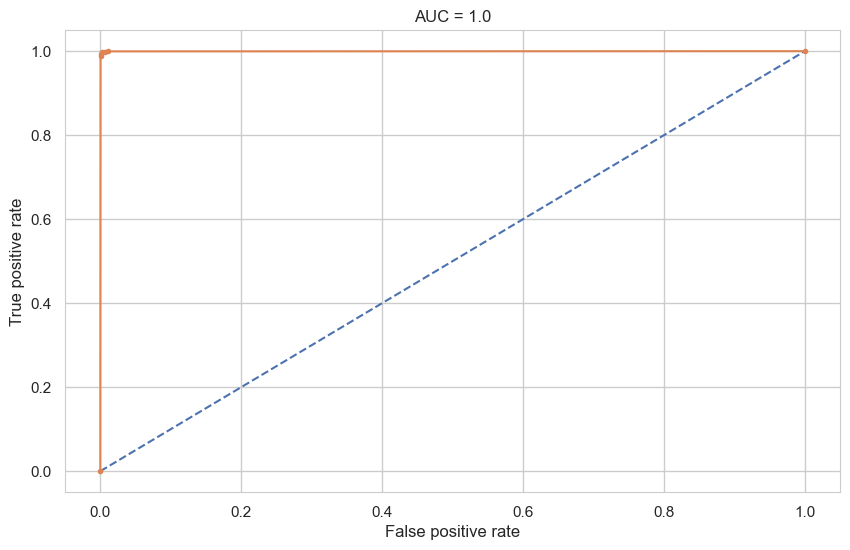

In [94]:
# ROC curve and AUC
probs = knn_model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
log_auc = roc_auc_score(y_test, probs)

# calculate roc curve
fpr, tpr, thresholds = roc_curve(y_test, probs)
# plot curve
sns.set_style('whitegrid')
plt.figure(figsize=(10,6))
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(fpr, tpr, marker='.')
plt.ylabel('True positive rate')
plt.xlabel('False positive rate')
plt.title(f"AUC = {round(log_auc,3)}")
plt.show()

### Naive Bayes

In [95]:
nb_model = GaussianNB()
nb_model.fit(X_train, y_train)
nb_pred = nb_model.predict(X_test)

print("Naive Bayes Accuracy:", accuracy_score(y_test, nb_pred))
print("Naive Bayes Classification Report:")
print(classification_report(y_test, nb_pred))

Naive Bayes Accuracy: 0.6087276895365974
Naive Bayes Classification Report:
              precision    recall  f1-score   support

           0       0.56      0.61      0.59      5530
           1       0.65      0.61      0.63      6684

    accuracy                           0.61     12214
   macro avg       0.61      0.61      0.61     12214
weighted avg       0.61      0.61      0.61     12214



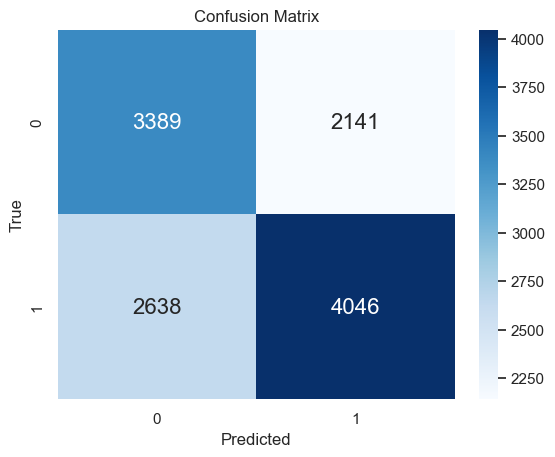

In [96]:
y_pred = nb_model.predict(X_test)

# confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix using seaborn
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', annot_kws={"size": 16})
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

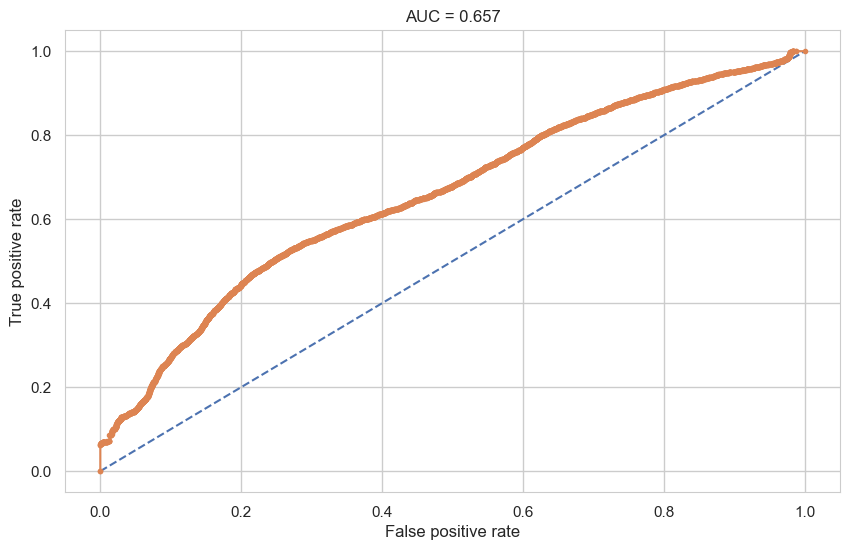

In [97]:
# ROC curve and AUC
probs = nb_model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
log_auc = roc_auc_score(y_test, probs)

# calculate roc curve
fpr, tpr, thresholds = roc_curve(y_test, probs)
# plot curve
sns.set_style('whitegrid')
plt.figure(figsize=(10,6))
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(fpr, tpr, marker='.')
plt.ylabel('True positive rate')
plt.xlabel('False positive rate')
plt.title(f"AUC = {round(log_auc,3)}")
plt.show()

### Gradient Boosting (XGBoost)

In [98]:
import xgboost as xgb
xgb_model = xgb.XGBClassifier()
xgb_model.fit(X_train, y_train)
xgb_pred = xgb_model.predict(X_test)

print("XGBoost Accuracy:", accuracy_score(y_test, xgb_pred))
print("XGBoost Classification Report:")
print(classification_report(y_test, xgb_pred))

XGBoost Accuracy: 0.9986081545767153
XGBoost Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5530
           1       1.00      1.00      1.00      6684

    accuracy                           1.00     12214
   macro avg       1.00      1.00      1.00     12214
weighted avg       1.00      1.00      1.00     12214



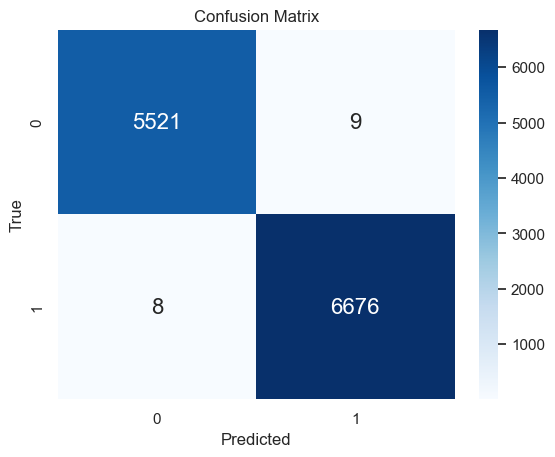

In [99]:
y_pred =xgb_model.predict(X_test)

# confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix using seaborn
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', annot_kws={"size": 16})
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

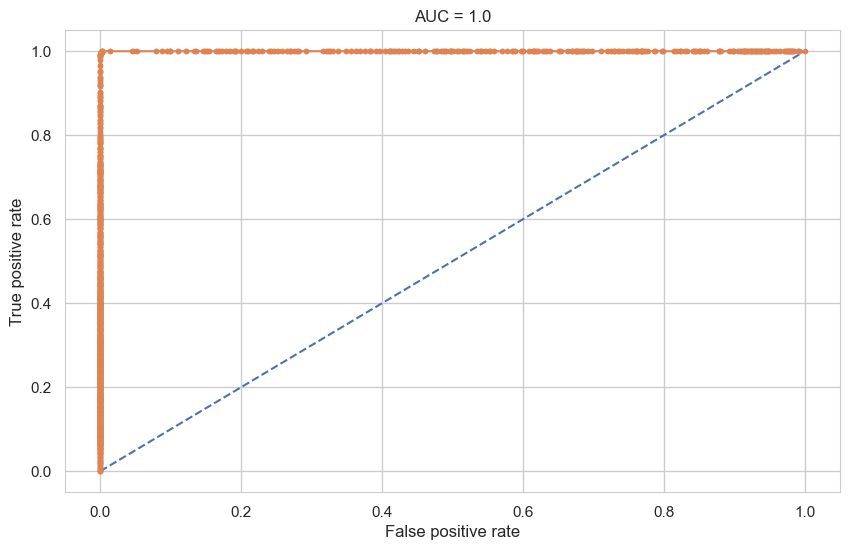

In [100]:
# ROC curve and AUC
probs = xgb_model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
log_auc = roc_auc_score(y_test, probs)

# calculate roc curve
fpr, tpr, thresholds = roc_curve(y_test, probs)
# plot curve
sns.set_style('whitegrid')
plt.figure(figsize=(10,6))
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(fpr, tpr, marker='.')
plt.ylabel('True positive rate')
plt.xlabel('False positive rate')
plt.title(f"AUC = {round(log_auc,3)}")
plt.show()

In [101]:
from sklearn.model_selection import cross_val_score, KFold
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

# Assuming X and y are your features and labels
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

# Specify the number of folds (e.g., k=5)
k_fold = KFold(n_splits=5, shuffle=True, random_state=42)

# Create your model (e.g., RandomForestClassifier)
model = RandomForestClassifier(n_estimators=100, random_state=42)

# Perform cross-validation and get the performance metrics
cross_val_results = cross_val_score(model, X_train, y_train, cv=k_fold, scoring='accuracy')

# Print the results
print("Cross-Validation Results:", cross_val_results)
print("Average Accuracy:", cross_val_results.mean())


Cross-Validation Results: [0.99904489 0.99795306 0.99877183 0.99849891 0.99863537]
Average Accuracy: 0.9985808120936092


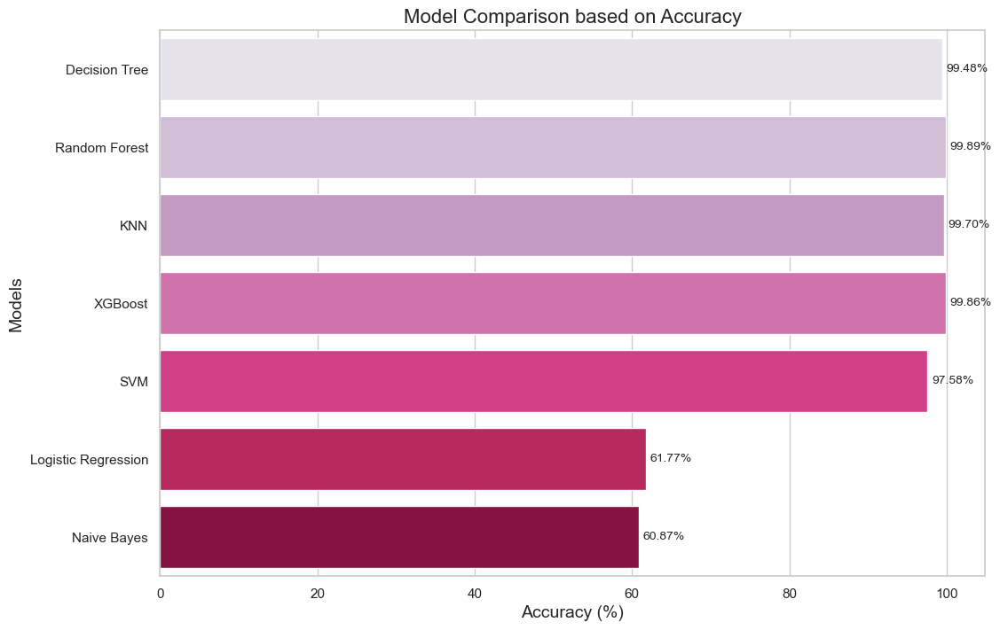

In [109]:
import matplotlib.pyplot as plt
import seaborn as sns

# Model names and corresponding accuracies
models = ['Decision Tree', 'Random Forest', 'KNN', 'XGBoost', 'SVM', 'Logistic Regression', 'Naive Bayes']
accuracies = [99.48, 99.89, 99.70, 99.86, 97.58, 61.77, 60.87]

# Set seaborn style
sns.set(style="whitegrid")

# Plotting the bar graph
plt.figure(figsize=(12, 8))
sns.barplot(x=accuracies, y=models, palette="PuRd")
plt.title('Model Comparison based on Accuracy', fontsize=16)
plt.xlabel('Accuracy (%)', fontsize=14)
plt.ylabel('Models', fontsize=14)

# Display the values on the bars
for i, v in enumerate(accuracies):
    plt.text(v + 0.5, i, f'{v:.2f}%', va='center', fontsize=10)

plt.show()
